In [5]:
import tensorflow as tf
from tensorflow.keras import layers
import matplotlib.pyplot as plt
import numpy as np
import time


In [6]:
# Load and preprocess the CIFAR-10 dataset
(train_images, train_labels), (_, _) = tf.keras.datasets.cifar10.load_data()
train_images = train_images.astype('float32')
train_images = (train_images - 127.5) / 127.5  # Normalize the images to [-1, 1]


In [7]:
def build_generator():
    model = tf.keras.Sequential()
    model.add(layers.Dense(8*8*256, use_bias=False, input_shape=(100,)))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Reshape((8, 8, 256)))
    model.add(layers.Conv2DTranspose(128, (5, 5), strides=(1, 1), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(64, (5, 5), strides=(2, 2), padding='same', use_bias=False))
    model.add(layers.BatchNormalization())
    model.add(layers.LeakyReLU())

    model.add(layers.Conv2DTranspose(3, (5, 5), strides=(2, 2), padding='same', use_bias=False, activation='tanh'))
    return model


In [8]:
def build_discriminator():
    model = tf.keras.Sequential()
    model.add(layers.Conv2D(64, (5, 5), strides=(2, 2), padding='same', input_shape=[32, 32, 3]))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Conv2D(128, (5, 5), strides=(2, 2), padding='same'))
    model.add(layers.LeakyReLU())
    model.add(layers.Dropout(0.3))

    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model


In [9]:
# Define loss function and optimizers
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
    real_loss = cross_entropy(tf.ones_like(real_output), real_output)
    fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
    total_loss = real_loss + fake_loss
    return total_loss

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)


In [17]:
EPOCHS = 100
noise_dim = 100
num_examples_to_generate = 16
seed = tf.random.normal([num_examples_to_generate, noise_dim])

In [18]:
@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)

        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    return gen_loss, disc_loss


In [19]:
# Create and compile models
generator = build_generator()
discriminator = build_discriminator()


In [20]:
generator.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_4 (Dense)             (None, 16384)             1638400   
                                                                 
 batch_normalization_6 (Bat  (None, 16384)             65536     
 chNormalization)                                                
                                                                 
 leaky_re_lu_10 (LeakyReLU)  (None, 16384)             0         
                                                                 
 reshape_2 (Reshape)         (None, 8, 8, 256)         0         
                                                                 
 conv2d_transpose_6 (Conv2D  (None, 8, 8, 128)         819200    
 Transpose)                                                      
                                                                 
 batch_normalization_7 (Bat  (None, 8, 8, 128)        

In [21]:
discriminator.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 16, 16, 64)        4864      
                                                                 
 leaky_re_lu_13 (LeakyReLU)  (None, 16, 16, 64)        0         
                                                                 
 dropout_4 (Dropout)         (None, 16, 16, 64)        0         
                                                                 
 conv2d_5 (Conv2D)           (None, 8, 8, 128)         204928    
                                                                 
 leaky_re_lu_14 (LeakyReLU)  (None, 8, 8, 128)         0         
                                                                 
 dropout_5 (Dropout)         (None, 8, 8, 128)         0         
                                                                 
 flatten_2 (Flatten)         (None, 8192)             

In [22]:
# Initialize the models
generator = build_generator()
discriminator = build_discriminator()

# Build the models to ensure all layers are initialized
generator.build(input_shape=(None, 100))  # Adjust the input shape based on your noise dimension
discriminator.build(input_shape=(None, 32, 32, 3))  # Adjust input shape to match CIFAR-10 image dimensions

# Create and compile models after building
generator_optimizer = tf.keras.optimizers.Adam(1e-4)
discriminator_optimizer = tf.keras.optimizers.Adam(1e-4)

# Configure the optimizers with the variables
generator_optimizer.build(generator.trainable_variables)
discriminator_optimizer.build(discriminator.trainable_variables)

@tf.function
def train_step(images):
    noise = tf.random.normal([BATCH_SIZE, noise_dim])
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(images, training=True)
        fake_output = discriminator(generated_images, training=True)
        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)
    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    return gen_loss, disc_loss


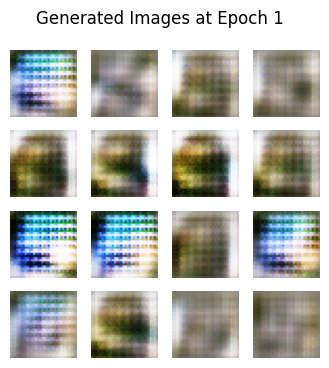

Epoch 1/100 - Generator Loss: 0.9341, Discriminator Loss: 1.2777 - Time Taken: 169.87 sec


<Figure size 640x480 with 0 Axes>

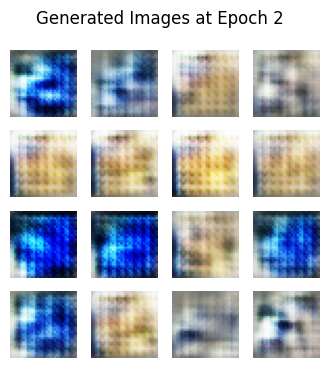

Epoch 2/100 - Generator Loss: 1.0615, Discriminator Loss: 1.2185 - Time Taken: 164.02 sec


<Figure size 640x480 with 0 Axes>

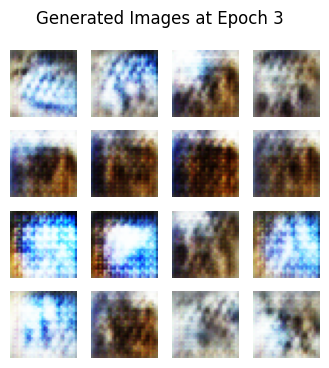

Epoch 3/100 - Generator Loss: 0.8092, Discriminator Loss: 1.6920 - Time Taken: 158.22 sec


<Figure size 640x480 with 0 Axes>

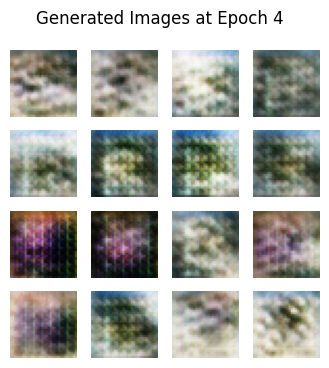

Epoch 4/100 - Generator Loss: 0.7361, Discriminator Loss: 1.2987 - Time Taken: 157.09 sec


<Figure size 640x480 with 0 Axes>

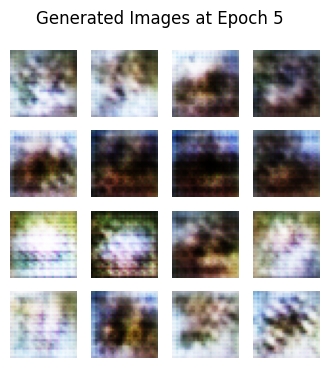

Epoch 5/100 - Generator Loss: 1.2502, Discriminator Loss: 1.1228 - Time Taken: 156.99 sec


<Figure size 640x480 with 0 Axes>

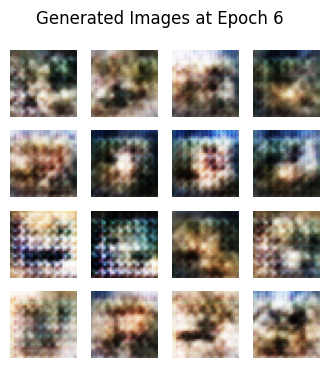

Epoch 6/100 - Generator Loss: 0.9812, Discriminator Loss: 1.4240 - Time Taken: 156.94 sec


<Figure size 640x480 with 0 Axes>

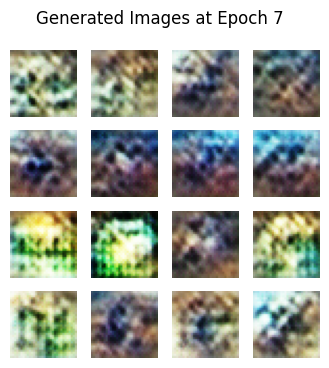

Epoch 7/100 - Generator Loss: 0.7597, Discriminator Loss: 1.5265 - Time Taken: 159.94 sec


<Figure size 640x480 with 0 Axes>

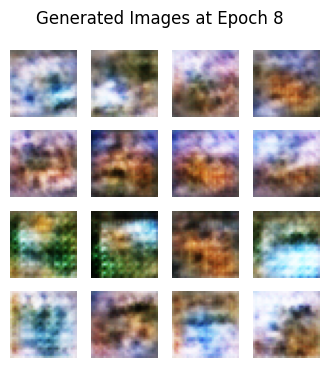

Epoch 8/100 - Generator Loss: 1.0404, Discriminator Loss: 1.1523 - Time Taken: 159.51 sec


<Figure size 640x480 with 0 Axes>

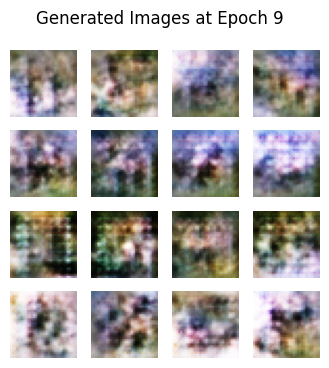

Epoch 9/100 - Generator Loss: 1.2566, Discriminator Loss: 1.0486 - Time Taken: 156.18 sec


<Figure size 640x480 with 0 Axes>

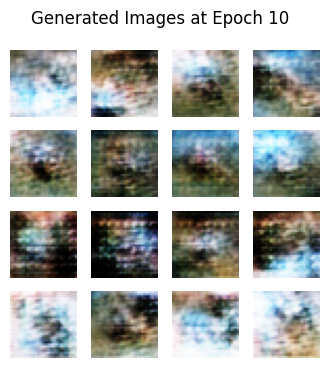

Epoch 10/100 - Generator Loss: 1.1700, Discriminator Loss: 1.0708 - Time Taken: 156.57 sec


<Figure size 640x480 with 0 Axes>

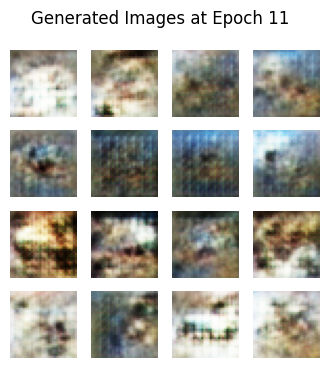

Epoch 11/100 - Generator Loss: 0.8928, Discriminator Loss: 1.6335 - Time Taken: 155.94 sec


<Figure size 640x480 with 0 Axes>

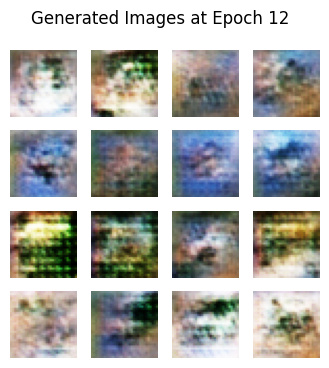

Epoch 12/100 - Generator Loss: 1.2045, Discriminator Loss: 1.0142 - Time Taken: 156.27 sec


<Figure size 640x480 with 0 Axes>

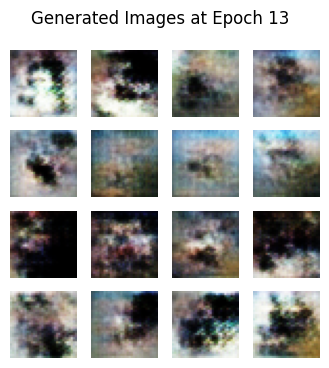

Epoch 13/100 - Generator Loss: 1.0434, Discriminator Loss: 1.0453 - Time Taken: 157.41 sec


<Figure size 640x480 with 0 Axes>

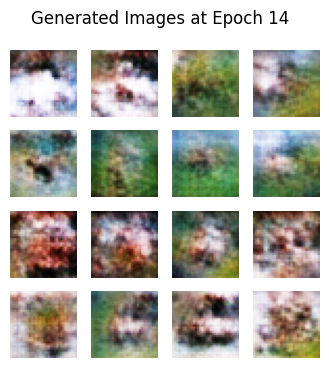

Epoch 14/100 - Generator Loss: 0.9640, Discriminator Loss: 1.0896 - Time Taken: 155.61 sec


<Figure size 640x480 with 0 Axes>

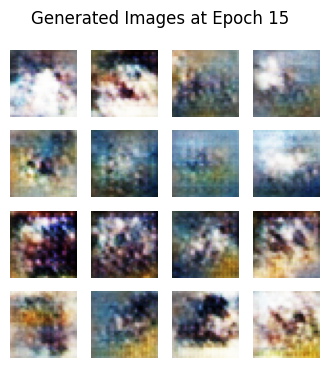

Epoch 15/100 - Generator Loss: 0.9160, Discriminator Loss: 1.2906 - Time Taken: 160.00 sec


<Figure size 640x480 with 0 Axes>

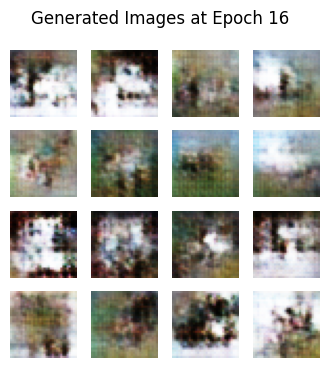

Epoch 16/100 - Generator Loss: 0.8248, Discriminator Loss: 1.6522 - Time Taken: 156.40 sec


<Figure size 640x480 with 0 Axes>

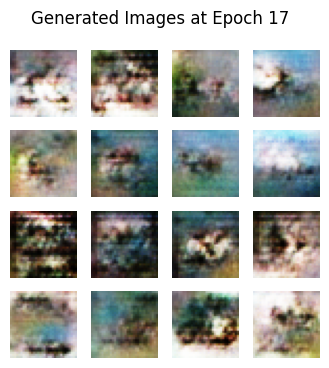

Epoch 17/100 - Generator Loss: 1.2123, Discriminator Loss: 0.8915 - Time Taken: 156.01 sec


<Figure size 640x480 with 0 Axes>

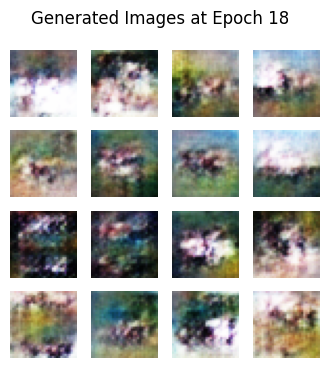

Epoch 18/100 - Generator Loss: 1.0547, Discriminator Loss: 1.1490 - Time Taken: 156.06 sec


<Figure size 640x480 with 0 Axes>

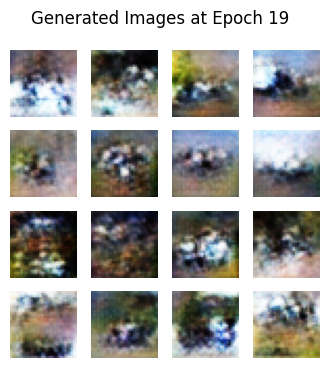

Epoch 19/100 - Generator Loss: 0.9116, Discriminator Loss: 1.3088 - Time Taken: 158.26 sec


<Figure size 640x480 with 0 Axes>

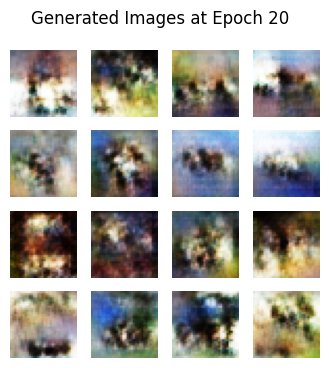

Epoch 20/100 - Generator Loss: 1.1773, Discriminator Loss: 1.0139 - Time Taken: 160.95 sec


<Figure size 640x480 with 0 Axes>

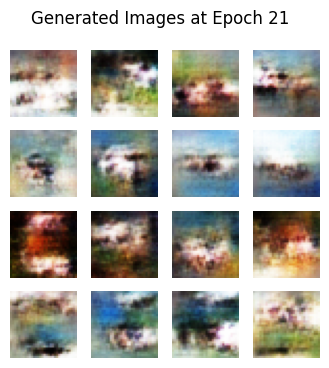

Epoch 21/100 - Generator Loss: 0.9831, Discriminator Loss: 1.0983 - Time Taken: 156.52 sec


<Figure size 640x480 with 0 Axes>

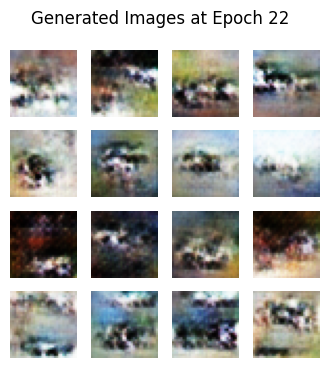

Epoch 22/100 - Generator Loss: 1.0132, Discriminator Loss: 0.9665 - Time Taken: 156.92 sec


<Figure size 640x480 with 0 Axes>

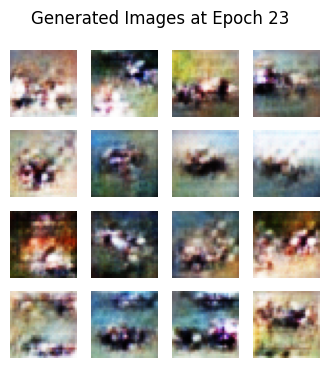

Epoch 23/100 - Generator Loss: 1.1542, Discriminator Loss: 1.1903 - Time Taken: 156.20 sec


<Figure size 640x480 with 0 Axes>

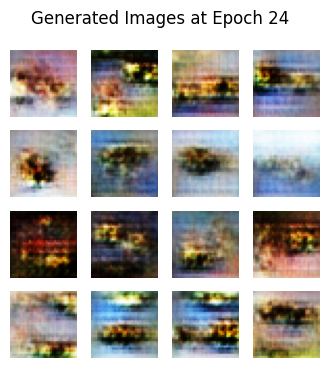

Epoch 24/100 - Generator Loss: 1.1038, Discriminator Loss: 1.1550 - Time Taken: 157.13 sec


<Figure size 640x480 with 0 Axes>

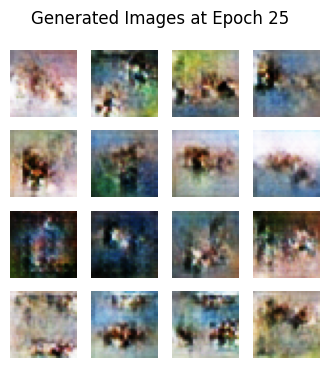

Epoch 25/100 - Generator Loss: 1.0746, Discriminator Loss: 0.9275 - Time Taken: 156.16 sec


<Figure size 640x480 with 0 Axes>

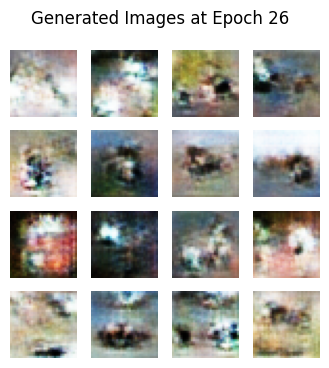

Epoch 26/100 - Generator Loss: 0.9935, Discriminator Loss: 1.1247 - Time Taken: 156.03 sec


<Figure size 640x480 with 0 Axes>

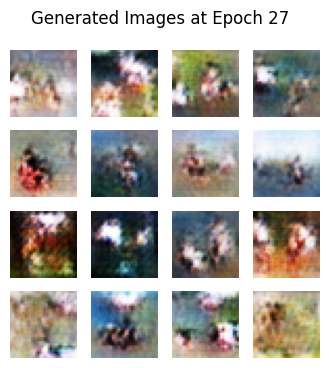

Epoch 27/100 - Generator Loss: 1.0260, Discriminator Loss: 1.1715 - Time Taken: 156.72 sec


<Figure size 640x480 with 0 Axes>

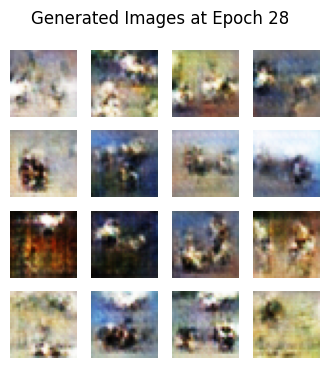

Epoch 28/100 - Generator Loss: 1.1032, Discriminator Loss: 1.2488 - Time Taken: 156.56 sec


<Figure size 640x480 with 0 Axes>

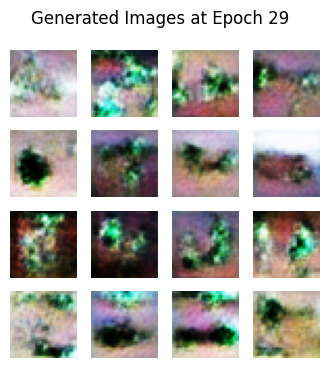

Epoch 29/100 - Generator Loss: 1.1730, Discriminator Loss: 0.7714 - Time Taken: 156.32 sec


<Figure size 640x480 with 0 Axes>

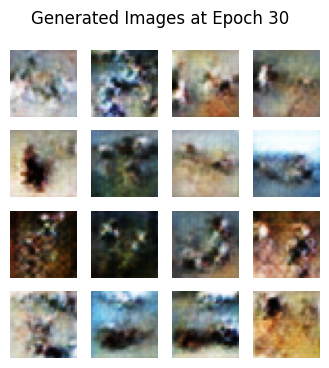

Epoch 30/100 - Generator Loss: 1.0729, Discriminator Loss: 1.3286 - Time Taken: 157.97 sec


<Figure size 640x480 with 0 Axes>

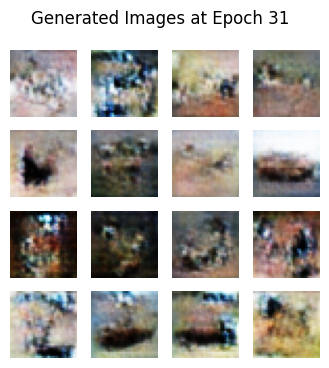

Epoch 31/100 - Generator Loss: 1.3947, Discriminator Loss: 1.1169 - Time Taken: 156.96 sec


<Figure size 640x480 with 0 Axes>

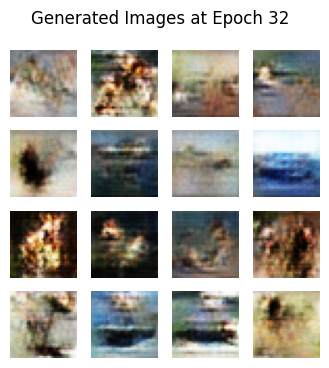

Epoch 32/100 - Generator Loss: 1.0527, Discriminator Loss: 1.3176 - Time Taken: 158.68 sec


<Figure size 640x480 with 0 Axes>

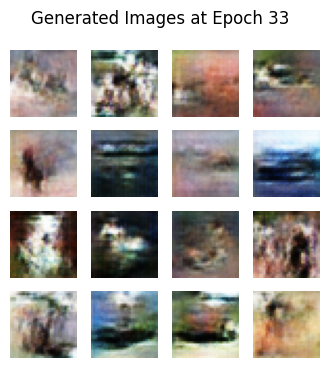

Epoch 33/100 - Generator Loss: 1.5937, Discriminator Loss: 0.7611 - Time Taken: 162.52 sec


<Figure size 640x480 with 0 Axes>

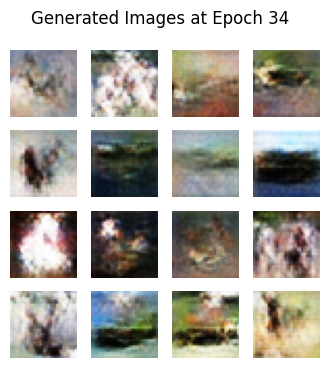

Epoch 34/100 - Generator Loss: 1.2580, Discriminator Loss: 0.9335 - Time Taken: 159.49 sec


<Figure size 640x480 with 0 Axes>

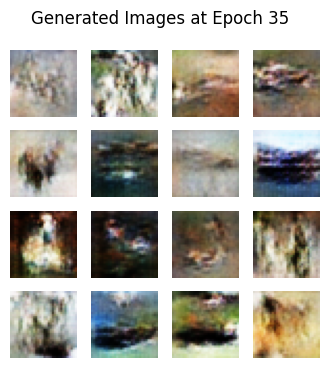

Epoch 35/100 - Generator Loss: 1.1185, Discriminator Loss: 1.3051 - Time Taken: 157.73 sec


<Figure size 640x480 with 0 Axes>

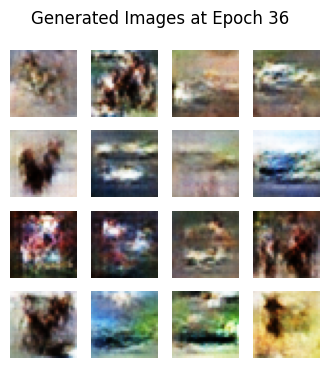

Epoch 36/100 - Generator Loss: 1.2999, Discriminator Loss: 0.9704 - Time Taken: 159.24 sec


<Figure size 640x480 with 0 Axes>

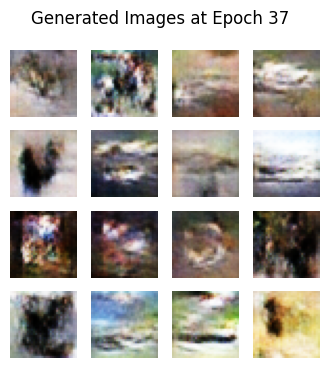

Epoch 37/100 - Generator Loss: 1.2421, Discriminator Loss: 0.9770 - Time Taken: 155.95 sec


<Figure size 640x480 with 0 Axes>

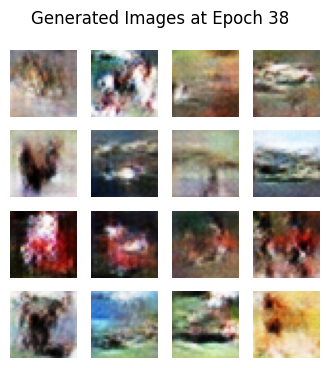

Epoch 38/100 - Generator Loss: 1.0985, Discriminator Loss: 1.3586 - Time Taken: 160.45 sec


<Figure size 640x480 with 0 Axes>

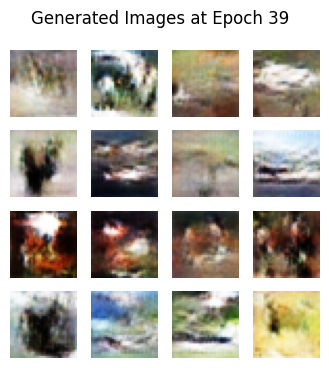

Epoch 39/100 - Generator Loss: 1.4627, Discriminator Loss: 0.8453 - Time Taken: 156.66 sec


<Figure size 640x480 with 0 Axes>

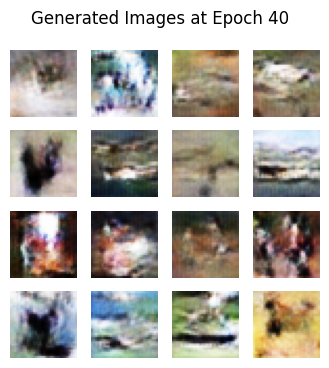

Epoch 40/100 - Generator Loss: 1.2762, Discriminator Loss: 1.1688 - Time Taken: 156.91 sec


<Figure size 640x480 with 0 Axes>

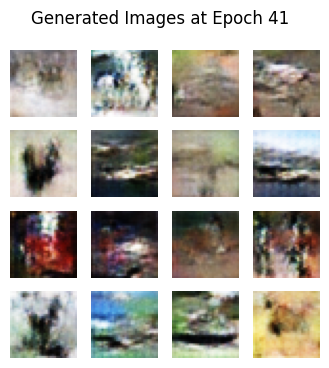

Epoch 41/100 - Generator Loss: 1.1450, Discriminator Loss: 1.1354 - Time Taken: 159.32 sec


<Figure size 640x480 with 0 Axes>

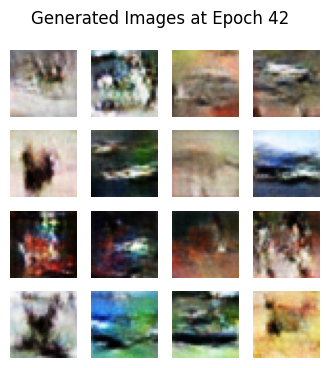

Epoch 42/100 - Generator Loss: 1.1264, Discriminator Loss: 1.2262 - Time Taken: 157.60 sec


<Figure size 640x480 with 0 Axes>

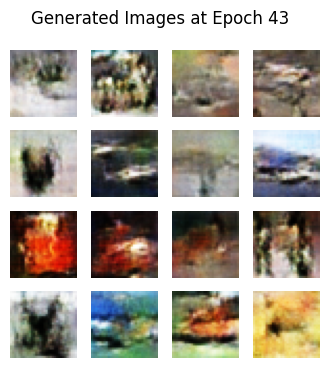

Epoch 43/100 - Generator Loss: 1.2602, Discriminator Loss: 1.2943 - Time Taken: 156.18 sec


<Figure size 640x480 with 0 Axes>

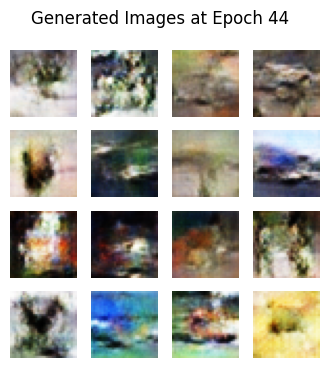

Epoch 44/100 - Generator Loss: 0.8526, Discriminator Loss: 1.1841 - Time Taken: 156.62 sec


<Figure size 640x480 with 0 Axes>

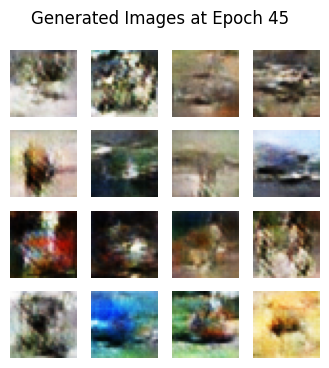

Epoch 45/100 - Generator Loss: 1.1130, Discriminator Loss: 1.0342 - Time Taken: 156.47 sec


<Figure size 640x480 with 0 Axes>

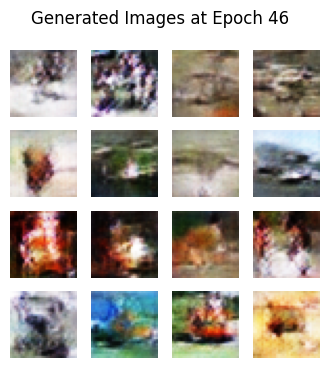

Epoch 46/100 - Generator Loss: 1.0734, Discriminator Loss: 1.1260 - Time Taken: 156.39 sec


<Figure size 640x480 with 0 Axes>

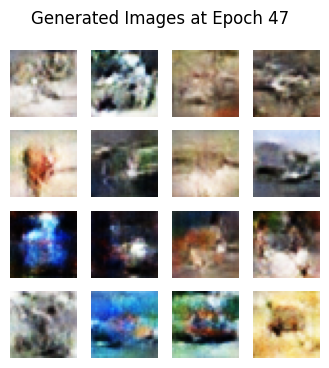

Epoch 47/100 - Generator Loss: 0.9555, Discriminator Loss: 1.3291 - Time Taken: 156.82 sec


<Figure size 640x480 with 0 Axes>

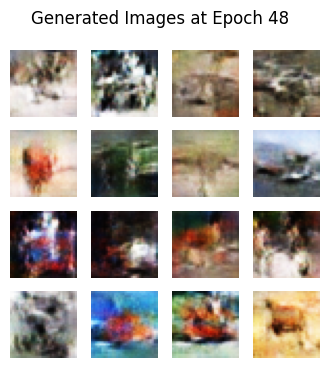

Epoch 48/100 - Generator Loss: 1.1265, Discriminator Loss: 1.4634 - Time Taken: 156.17 sec


<Figure size 640x480 with 0 Axes>

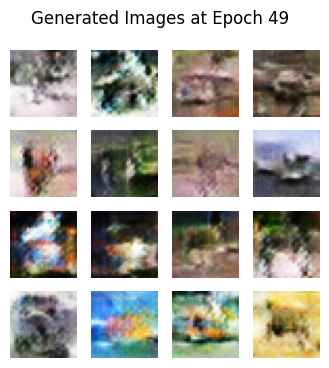

Epoch 49/100 - Generator Loss: 1.2326, Discriminator Loss: 1.0481 - Time Taken: 157.89 sec


<Figure size 640x480 with 0 Axes>

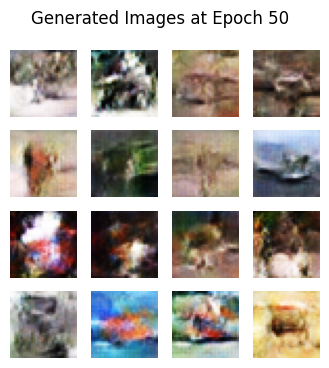

Epoch 50/100 - Generator Loss: 0.8791, Discriminator Loss: 1.3052 - Time Taken: 156.59 sec


<Figure size 640x480 with 0 Axes>

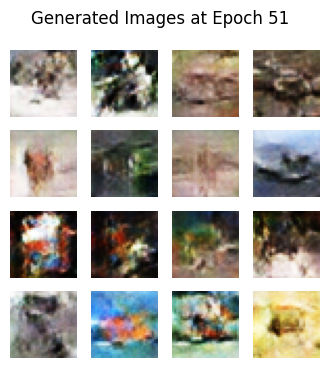

Epoch 51/100 - Generator Loss: 1.0660, Discriminator Loss: 0.9225 - Time Taken: 155.79 sec


<Figure size 640x480 with 0 Axes>

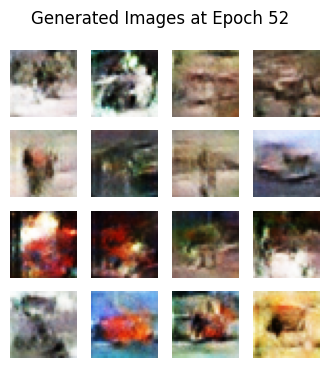

Epoch 52/100 - Generator Loss: 1.2222, Discriminator Loss: 1.2645 - Time Taken: 155.69 sec


<Figure size 640x480 with 0 Axes>

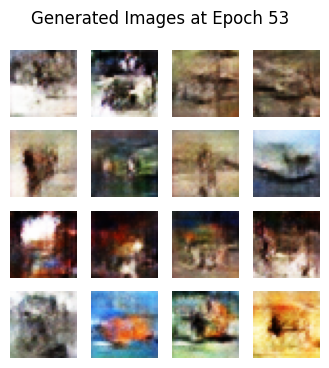

Epoch 53/100 - Generator Loss: 1.4689, Discriminator Loss: 1.1544 - Time Taken: 157.59 sec


<Figure size 640x480 with 0 Axes>

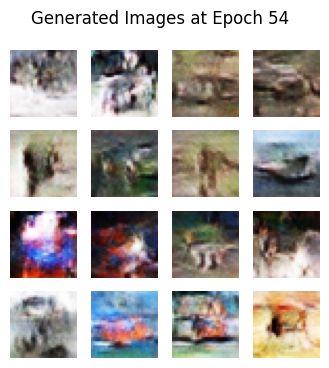

Epoch 54/100 - Generator Loss: 0.9999, Discriminator Loss: 1.1987 - Time Taken: 156.31 sec


<Figure size 640x480 with 0 Axes>

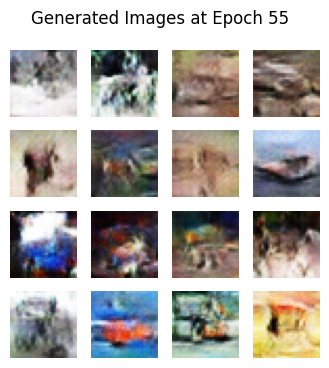

Epoch 55/100 - Generator Loss: 1.1720, Discriminator Loss: 1.1516 - Time Taken: 156.93 sec


<Figure size 640x480 with 0 Axes>

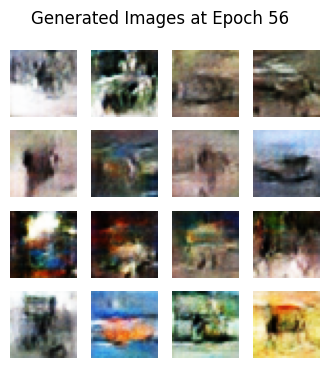

Epoch 56/100 - Generator Loss: 1.0397, Discriminator Loss: 1.3021 - Time Taken: 155.96 sec


<Figure size 640x480 with 0 Axes>

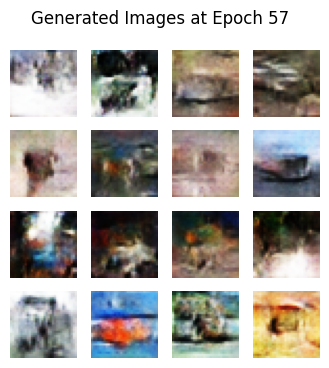

Epoch 57/100 - Generator Loss: 1.1892, Discriminator Loss: 0.9922 - Time Taken: 156.39 sec


<Figure size 640x480 with 0 Axes>

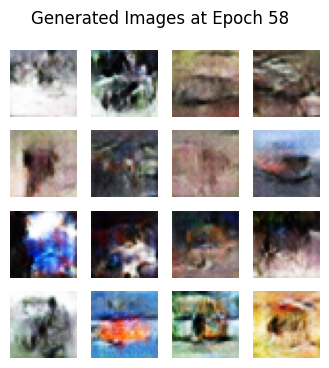

Epoch 58/100 - Generator Loss: 1.1008, Discriminator Loss: 1.1881 - Time Taken: 155.72 sec


<Figure size 640x480 with 0 Axes>

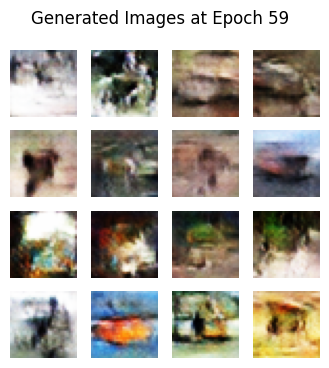

Epoch 59/100 - Generator Loss: 0.9843, Discriminator Loss: 0.9189 - Time Taken: 156.44 sec


<Figure size 640x480 with 0 Axes>

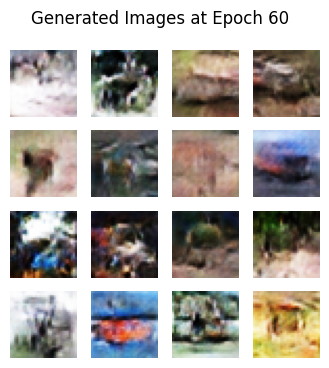

Epoch 60/100 - Generator Loss: 1.1277, Discriminator Loss: 0.8943 - Time Taken: 157.23 sec


<Figure size 640x480 with 0 Axes>

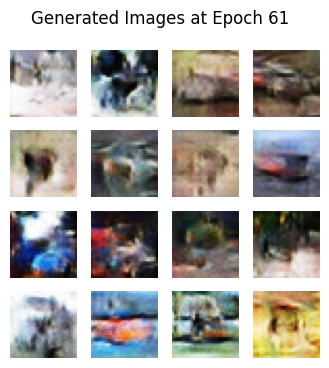

Epoch 61/100 - Generator Loss: 1.2222, Discriminator Loss: 1.1953 - Time Taken: 157.34 sec


<Figure size 640x480 with 0 Axes>

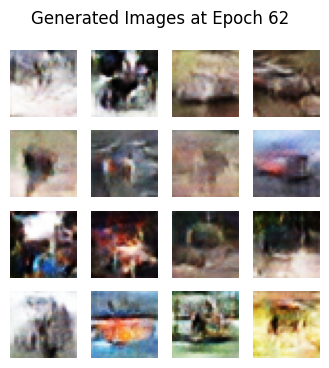

Epoch 62/100 - Generator Loss: 1.1388, Discriminator Loss: 1.2270 - Time Taken: 158.14 sec


<Figure size 640x480 with 0 Axes>

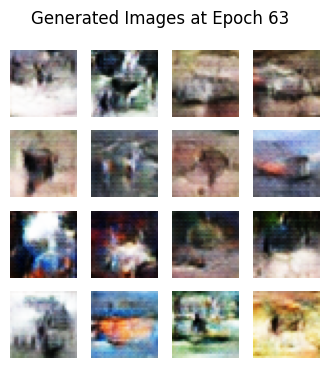

Epoch 63/100 - Generator Loss: 1.3563, Discriminator Loss: 0.8103 - Time Taken: 161.55 sec


<Figure size 640x480 with 0 Axes>

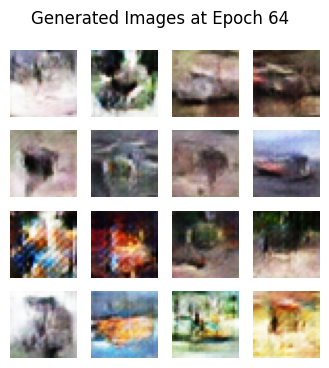

Epoch 64/100 - Generator Loss: 1.1755, Discriminator Loss: 1.2944 - Time Taken: 162.24 sec


<Figure size 640x480 with 0 Axes>

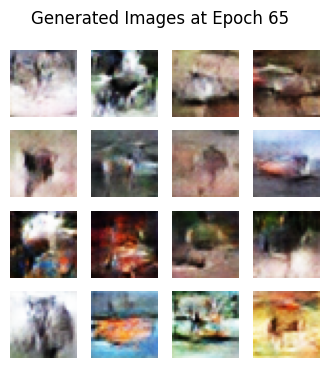

Epoch 65/100 - Generator Loss: 1.0022, Discriminator Loss: 1.1964 - Time Taken: 163.97 sec


<Figure size 640x480 with 0 Axes>

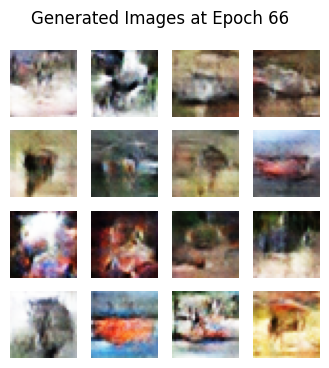

Epoch 66/100 - Generator Loss: 1.2827, Discriminator Loss: 1.5088 - Time Taken: 156.49 sec


<Figure size 640x480 with 0 Axes>

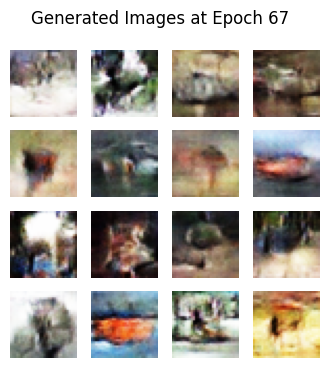

Epoch 67/100 - Generator Loss: 1.4232, Discriminator Loss: 0.8453 - Time Taken: 156.14 sec


<Figure size 640x480 with 0 Axes>

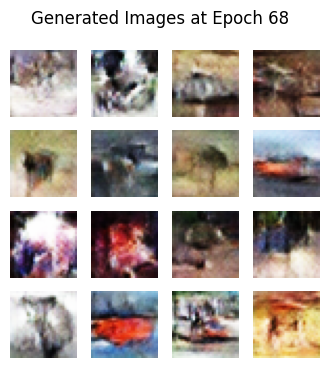

Epoch 68/100 - Generator Loss: 1.1634, Discriminator Loss: 1.0500 - Time Taken: 156.45 sec


<Figure size 640x480 with 0 Axes>

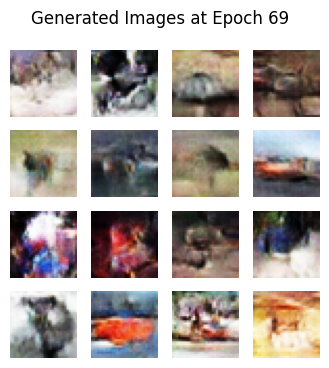

Epoch 69/100 - Generator Loss: 1.0675, Discriminator Loss: 1.0085 - Time Taken: 156.18 sec


<Figure size 640x480 with 0 Axes>

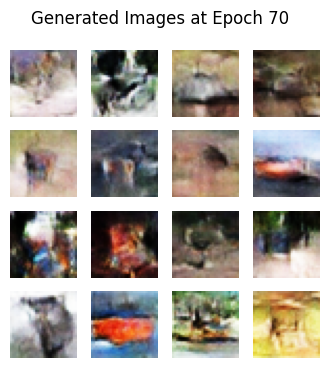

Epoch 70/100 - Generator Loss: 1.1919, Discriminator Loss: 0.9675 - Time Taken: 156.95 sec


<Figure size 640x480 with 0 Axes>

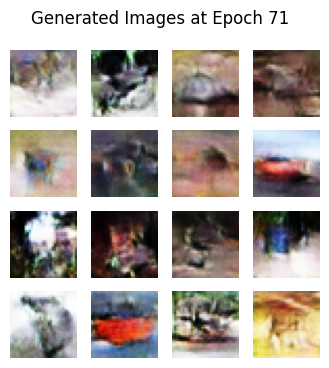

Epoch 71/100 - Generator Loss: 1.1848, Discriminator Loss: 1.5320 - Time Taken: 156.00 sec


<Figure size 640x480 with 0 Axes>

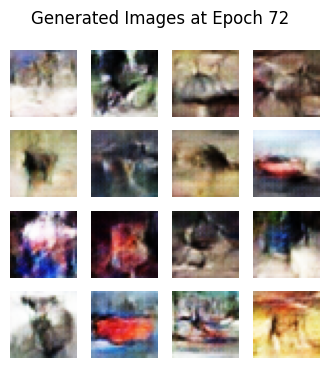

Epoch 72/100 - Generator Loss: 1.3209, Discriminator Loss: 0.9803 - Time Taken: 155.16 sec


<Figure size 640x480 with 0 Axes>

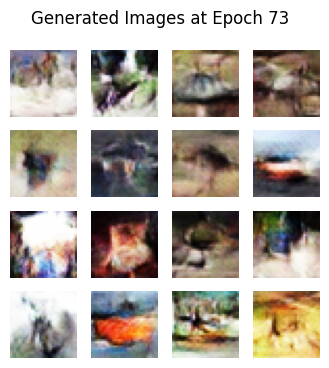

Epoch 73/100 - Generator Loss: 0.8987, Discriminator Loss: 1.3290 - Time Taken: 156.59 sec


<Figure size 640x480 with 0 Axes>

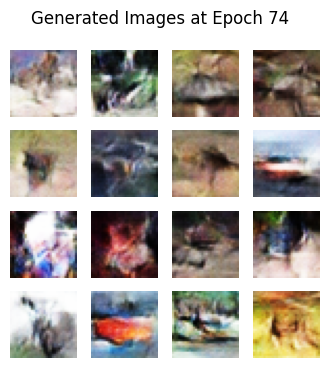

Epoch 74/100 - Generator Loss: 1.3787, Discriminator Loss: 0.9477 - Time Taken: 155.80 sec


<Figure size 640x480 with 0 Axes>

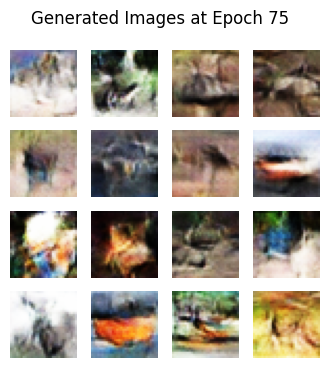

Epoch 75/100 - Generator Loss: 1.0859, Discriminator Loss: 1.0391 - Time Taken: 155.40 sec


<Figure size 640x480 with 0 Axes>

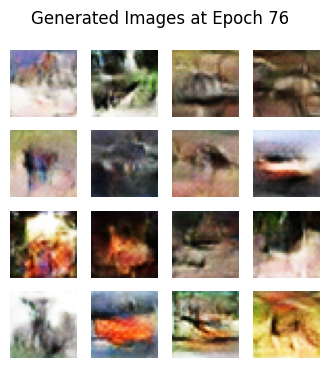

Epoch 76/100 - Generator Loss: 1.2058, Discriminator Loss: 1.1969 - Time Taken: 157.58 sec


<Figure size 640x480 with 0 Axes>

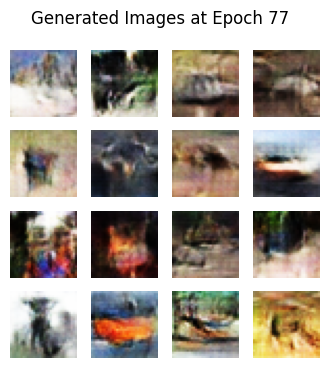

Epoch 77/100 - Generator Loss: 1.4552, Discriminator Loss: 1.1564 - Time Taken: 160.29 sec


<Figure size 640x480 with 0 Axes>

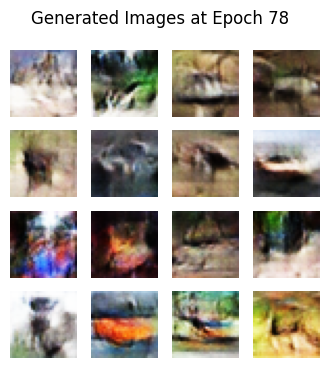

Epoch 78/100 - Generator Loss: 1.4965, Discriminator Loss: 0.7879 - Time Taken: 159.86 sec


<Figure size 640x480 with 0 Axes>

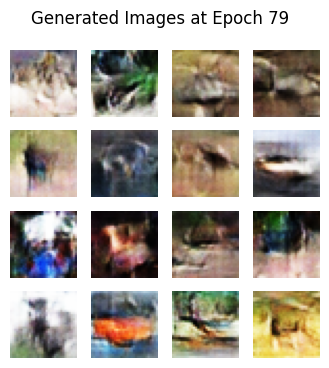

Epoch 79/100 - Generator Loss: 1.4413, Discriminator Loss: 1.0765 - Time Taken: 156.42 sec


<Figure size 640x480 with 0 Axes>

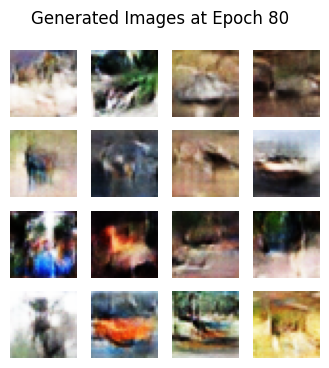

Epoch 80/100 - Generator Loss: 0.8938, Discriminator Loss: 1.4187 - Time Taken: 157.91 sec


<Figure size 640x480 with 0 Axes>

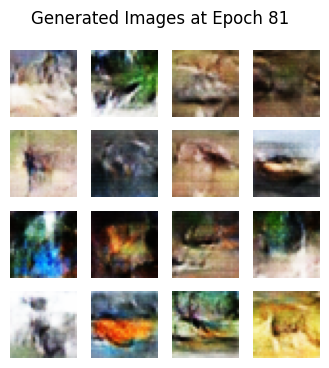

Epoch 81/100 - Generator Loss: 1.0738, Discriminator Loss: 1.2642 - Time Taken: 157.31 sec


<Figure size 640x480 with 0 Axes>

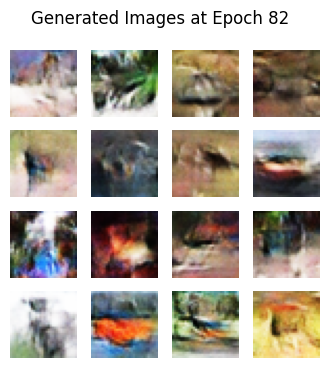

Epoch 82/100 - Generator Loss: 1.0687, Discriminator Loss: 1.2624 - Time Taken: 157.98 sec


<Figure size 640x480 with 0 Axes>

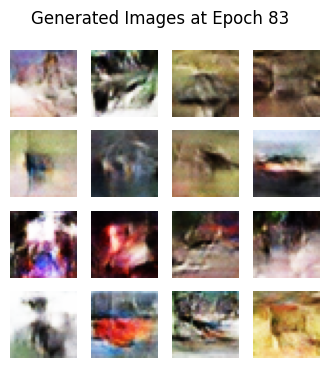

Epoch 83/100 - Generator Loss: 1.1962, Discriminator Loss: 1.1078 - Time Taken: 156.44 sec


<Figure size 640x480 with 0 Axes>

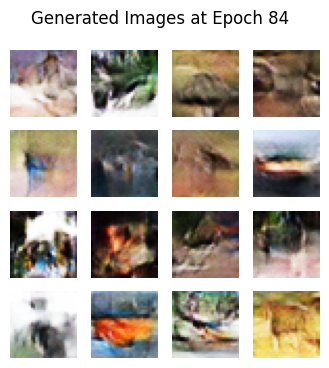

Epoch 84/100 - Generator Loss: 1.1126, Discriminator Loss: 1.2522 - Time Taken: 156.61 sec


<Figure size 640x480 with 0 Axes>

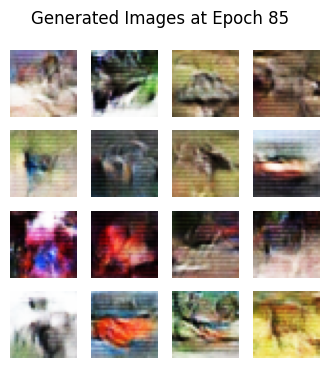

Epoch 85/100 - Generator Loss: 1.2485, Discriminator Loss: 0.8965 - Time Taken: 156.30 sec


<Figure size 640x480 with 0 Axes>

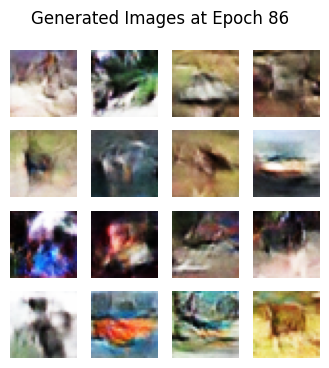

Epoch 86/100 - Generator Loss: 1.1019, Discriminator Loss: 1.3628 - Time Taken: 162.77 sec


<Figure size 640x480 with 0 Axes>

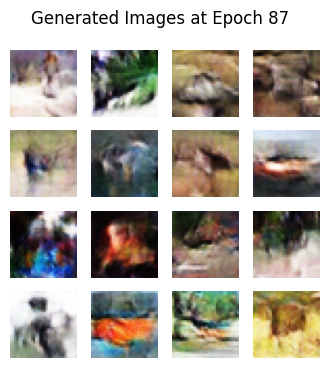

Epoch 87/100 - Generator Loss: 1.0935, Discriminator Loss: 1.3950 - Time Taken: 168.68 sec


<Figure size 640x480 with 0 Axes>

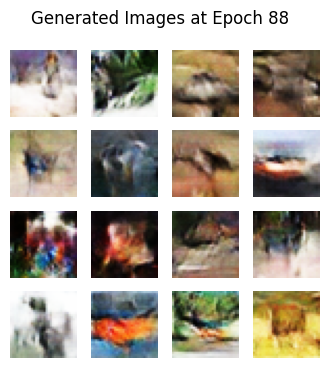

Epoch 88/100 - Generator Loss: 1.2551, Discriminator Loss: 0.8256 - Time Taken: 161.82 sec


<Figure size 640x480 with 0 Axes>

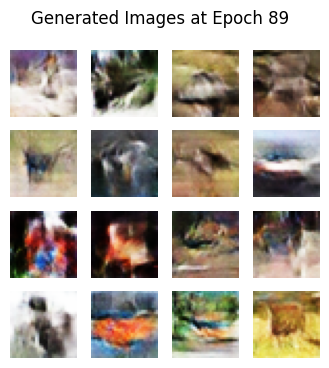

Epoch 89/100 - Generator Loss: 1.0529, Discriminator Loss: 1.2448 - Time Taken: 160.93 sec


<Figure size 640x480 with 0 Axes>

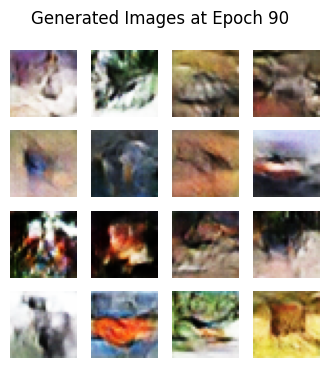

Epoch 90/100 - Generator Loss: 1.1724, Discriminator Loss: 1.3229 - Time Taken: 161.28 sec


<Figure size 640x480 with 0 Axes>

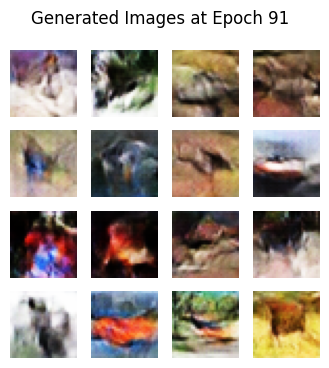

Epoch 91/100 - Generator Loss: 1.1050, Discriminator Loss: 1.0499 - Time Taken: 161.49 sec


<Figure size 640x480 with 0 Axes>

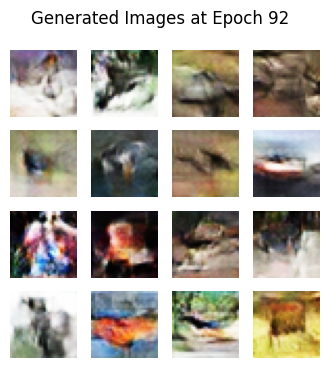

Epoch 92/100 - Generator Loss: 1.2284, Discriminator Loss: 1.0910 - Time Taken: 160.66 sec


<Figure size 640x480 with 0 Axes>

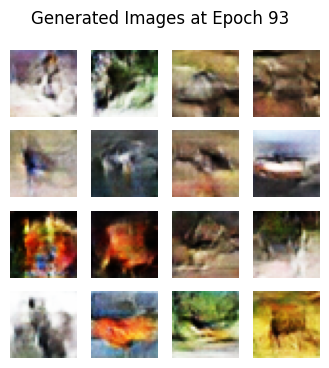

Epoch 93/100 - Generator Loss: 1.1708, Discriminator Loss: 0.9951 - Time Taken: 161.95 sec


<Figure size 640x480 with 0 Axes>

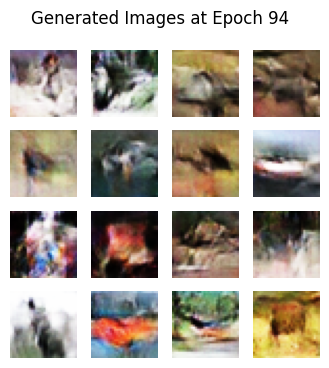

Epoch 94/100 - Generator Loss: 1.2667, Discriminator Loss: 1.2792 - Time Taken: 160.46 sec


<Figure size 640x480 with 0 Axes>

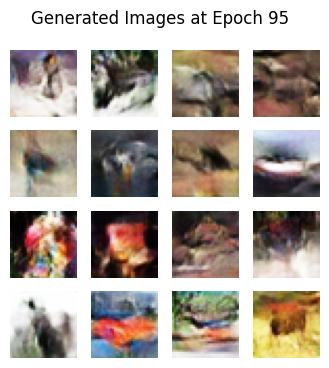

Epoch 95/100 - Generator Loss: 0.8980, Discriminator Loss: 1.1151 - Time Taken: 160.98 sec


<Figure size 640x480 with 0 Axes>

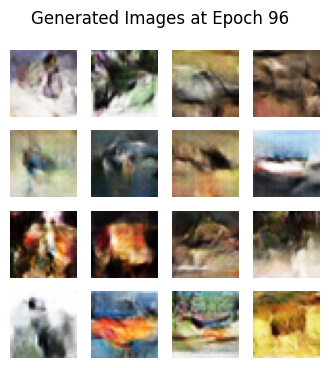

Epoch 96/100 - Generator Loss: 1.1504, Discriminator Loss: 1.2770 - Time Taken: 161.73 sec


<Figure size 640x480 with 0 Axes>

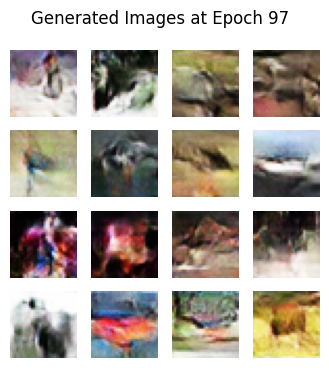

Epoch 97/100 - Generator Loss: 1.0856, Discriminator Loss: 1.1220 - Time Taken: 162.22 sec


<Figure size 640x480 with 0 Axes>

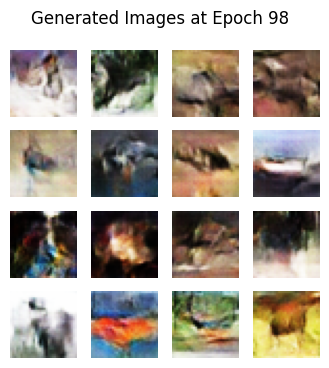

Epoch 98/100 - Generator Loss: 1.1443, Discriminator Loss: 0.9166 - Time Taken: 162.24 sec


<Figure size 640x480 with 0 Axes>

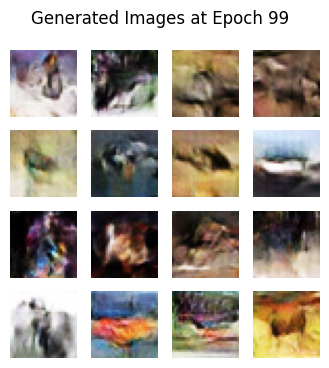

Epoch 99/100 - Generator Loss: 1.3180, Discriminator Loss: 1.0746 - Time Taken: 162.00 sec


<Figure size 640x480 with 0 Axes>

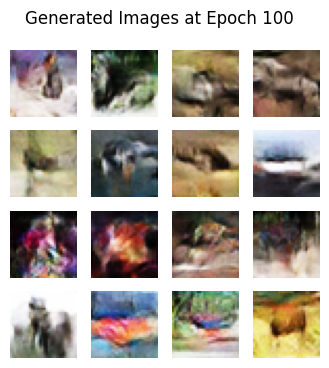

Epoch 100/100 - Generator Loss: 0.9847, Discriminator Loss: 1.1212 - Time Taken: 161.69 sec


<Figure size 640x480 with 0 Axes>

In [23]:

# Prepare the dataset for training
BUFFER_SIZE = 20000
BATCH_SIZE = 32

train_dataset = tf.data.Dataset.from_tensor_slices(train_images).shuffle(BUFFER_SIZE).batch(BATCH_SIZE)


def generate_and_save_images(model, epoch, test_input):
    predictions = model(test_input, training=False)
    fig = plt.figure(figsize=(4, 4))

    for i in range(predictions.shape[0]):
        plt.subplot(4, 4, i+1)
        plt.imshow((predictions[i, :, :, :] + 1) / 2)  # Adjusting normalization for display
        plt.axis('off')

    plt.suptitle(f"Generated Images at Epoch {epoch}")
    plt.show()  # Ensures the image is displayed in Jupyter Notebook
    plt.savefig(f'image_at_epoch_{epoch:04d}.png')  # Save each epoch's generated images

def train(dataset, epochs):
    for epoch in range(epochs):
        start_time = time.time()  # Start timing the epoch
        for image_batch in dataset:
            gen_loss, disc_loss = train_step(image_batch)  # Capture losses from train_step

        # Generate and display images
        generate_and_save_images(generator, epoch + 1, seed)

        end_time = time.time()  # End timing the epoch
        print(f"Epoch {epoch+1}/{EPOCHS} - Generator Loss: {gen_loss.numpy():.4f}, Discriminator Loss: {disc_loss.numpy():.4f} - Time Taken: {end_time - start_time:.2f} sec")


# Start the training process
train(train_dataset, EPOCHS)


In [24]:
# Save Models After Training
generator.save("cifar10_generator_2.h5")
discriminator.save("cifar10_discriminator_2.h5")
print("Training Complete and Models Saved!")

Training Complete and Models Saved!


c:\Python311\Lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [31]:
def plot_training_losses(gen_losses, disc_losses, epochs):
    plt.figure(figsize=(12, 6))
    plt.plot(epochs, gen_losses, label='Generator Loss', color='blue')
    plt.plot(epochs, disc_losses, label='Discriminator Loss', color='red')
    plt.title('Training and Discriminator Losses Over Epochs')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()
    plt.grid(True)
    plt.show()


In [32]:
# Generator and discriminator losses for each epoch
gen_losses = [
    0.9341, 1.0615, 0.8092, 0.7361, 1.2502, 0.9812, 0.7597, 1.0404, 1.2566, 1.1700,
    0.8928, 1.2045, 1.0434, 0.9640, 0.9160, 0.8248, 1.2123, 1.0547, 0.9116, 1.1773,
    0.9831, 1.0132, 1.1542, 1.1038, 1.0746, 0.9935, 1.0260, 1.1032, 1.1730, 1.0729,
    1.3947, 1.0527, 1.5937, 1.2580, 1.1185, 1.2999, 1.2421, 1.0985, 1.4627, 1.2762,
    1.1450, 1.1264, 1.2602, 0.8526, 1.1130, 1.0734, 0.9555, 1.1265, 1.2326, 0.8791,
    1.0660, 1.2222, 1.4689, 0.9999, 1.1720, 1.0397, 1.1892, 1.1008, 0.9843, 1.1277,
    1.2222, 1.1388, 1.3563, 1.1755, 1.0022, 1.2827, 1.4232, 1.1634, 1.0675, 1.1919,
    1.1848, 1.3209, 0.8987, 1.3787, 1.0859, 1.2058, 1.4552, 1.4965, 1.4413, 0.8938,
    1.0738, 1.0687, 1.1962, 1.1126, 1.2485, 1.1019, 1.0935, 1.2551, 1.0529, 1.1724,
    1.1050, 1.2284, 1.1708, 1.2667, 0.8980, 1.1504, 1.0856, 1.1443, 1.3180, 0.9847
]

disc_losses = [
    1.2777, 1.2185, 1.6920, 1.2987, 1.1228, 1.4240, 1.5265, 1.1523, 1.0486, 1.0708,
    1.6335, 1.0142, 1.0453, 1.0896, 1.2906, 1.6522, 0.8915, 1.1490, 1.3088, 1.0139,
    1.0983, 0.9665, 1.1903, 1.1550, 0.9275, 1.1247, 1.1715, 1.2488, 0.7714, 1.3286,
    1.1169, 1.3176, 0.7611, 0.9335, 1.3051, 0.9704, 0.9770, 1.3586, 0.8453, 1.1688,
    1.1354, 1.2262, 1.2943, 1.1841, 1.0342, 1.1260, 1.3291, 1.4634, 1.0481, 1.3052,
    0.9225, 1.2645, 1.1544, 1.1987, 1.1516, 1.3021, 0.9922, 1.1881, 0.9189, 0.8943,
    1.1953, 1.2270, 0.8103, 1.2944, 1.1964, 1.5088, 0.8453, 1.0500, 1.0085, 0.9675,
    1.5320, 0.9803, 1.3290, 0.9477, 1.0391, 1.1969, 1.1564, 0.7879, 1.0765, 1.4187,
    1.2642, 1.2624, 1.1078, 1.2522, 0.8965, 1.3628, 1.3950, 0.8256, 1.2448, 1.3229,
    1.0499, 1.0910, 0.9951, 1.2792, 1.1151, 1.2770, 1.1220, 0.9166, 1.0746, 1.1212
]

# Time taken for each epoch
times = [
    169.87, 164.02, 158.22, 157.09, 156.99, 156.94, 159.94, 159.51, 156.18, 156.57,
    155.94, 156.27, 157.41, 155.61, 160.00, 156.40, 156.01, 156.06, 158.26, 160.95,
    156.52, 156.92, 156.20, 157.13, 156.16, 156.03, 156.72, 156.56, 156.32, 157.97,
    156.96, 158.68, 162.52, 159.49, 157.73, 159.24, 155.95, 160.45, 156.66, 156.91,
    159.32, 157.60, 156.18, 156.62, 156.47, 156.39, 156.82, 156.17, 157.89, 156.59,
    155.79, 155.69, 157.59, 156.31, 156.93, 155.96, 156.39, 155.72, 156.44, 157.23,
    157.34, 158.14, 161.55, 162.24, 163.97, 156.49, 156.14, 156.45, 156.18, 156.95,
    156.00, 155.16, 156.59, 155.80, 155.40, 157.58, 160.29, 159.86, 156.42, 157.91,
    157.31, 157.98, 156.44, 156.61, 156.30, 162.77, 168.68, 161.82, 160.93, 161.28,
    161.49, 160.66, 161.95, 160.46, 160.98, 161.73, 162.22, 162.24, 162.00, 161.69
]


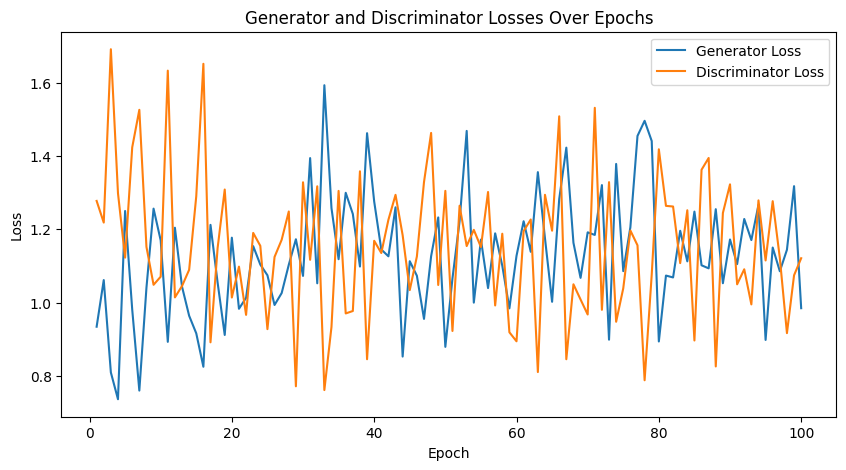

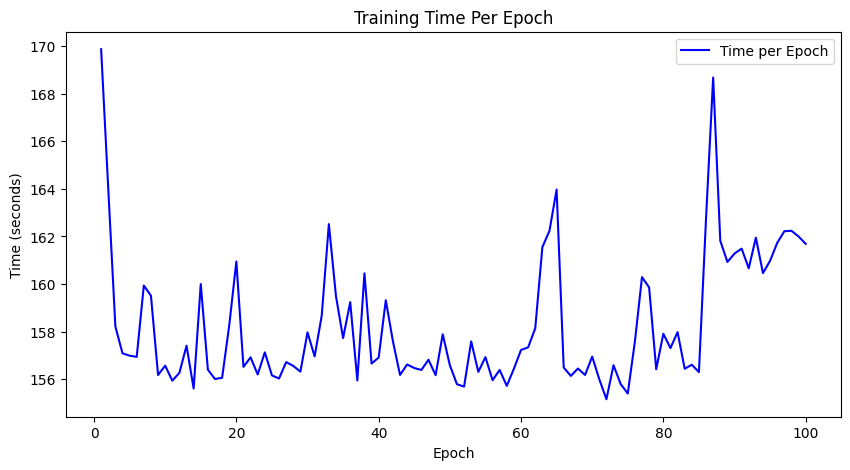

In [28]:
import matplotlib.pyplot as plt

epochs = range(1, 101)

# Plotting the losses
plt.figure(figsize=(10, 5))
plt.plot(epochs, gen_losses, label='Generator Loss')
plt.plot(epochs, disc_losses, label='Discriminator Loss')
plt.title('Generator and Discriminator Losses Over Epochs')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Plotting the training times
plt.figure(figsize=(10, 5))
plt.plot(epochs, times, color='blue', label='Time per Epoch')
plt.title('Training Time Per Epoch')
plt.xlabel('Epoch')
plt.ylabel('Time (seconds)')
plt.legend()
plt.show()


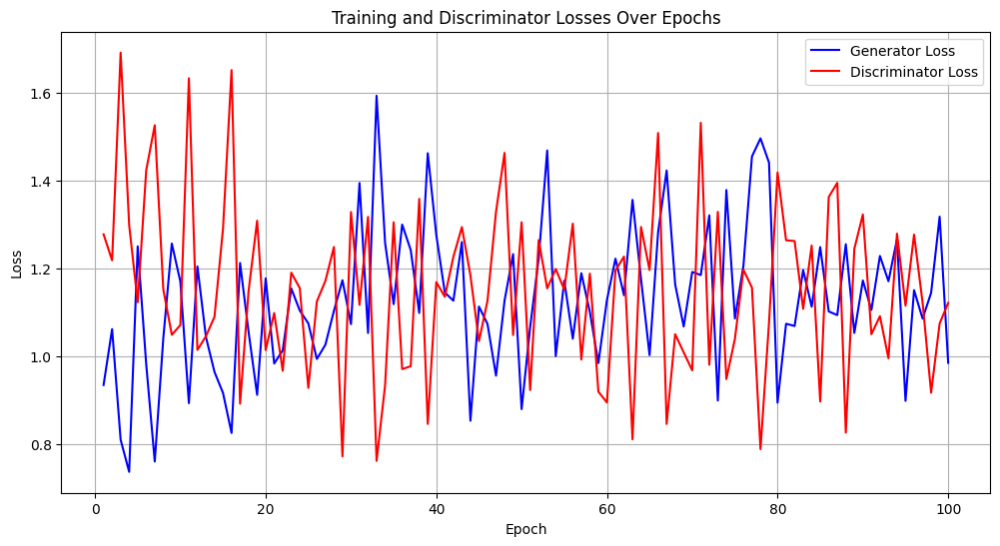

In [33]:
epochs = list(range(1, 101))  # Epochs from 1 to 100

plot_training_losses(gen_losses, disc_losses, epochs)

In [5]:
import tensorflow as tf

# Load trained models
generator = tf.keras.models.load_model("cifar10_generator_2.h5")
discriminator = tf.keras.models.load_model("cifar10_discriminator_2.h5")

print("✅ Models loaded successfully!")





✅ Models loaded successfully!


In [7]:
import numpy as np

# Generate 1000 fake images using the trained generator
noise = tf.random.normal([1000, 100])  # 1000 noise vectors
generated_images = generator(noise, training=False).numpy()

print("✅ Generated images for evaluation!")


✅ Generated images for evaluation!


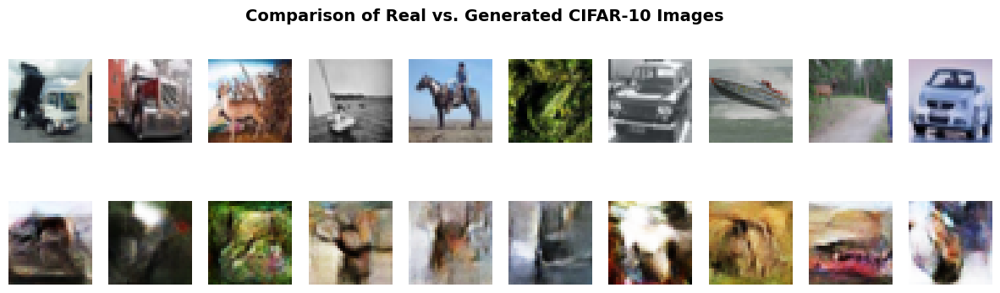

In [12]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Load trained generator model
generator = tf.keras.models.load_model("cifar10_generator_2.h5")

# Load real CIFAR-10 dataset
(train_images, _), (_, _) = tf.keras.datasets.cifar10.load_data()
train_images = (train_images.astype("float32") - 127.5) / 127.5  # Normalize to [-1,1]

# Generate fake images using the trained generator
num_images = 10  # Number of images to compare
noise = tf.random.normal([num_images, 100])  # Noise for generator
generated_images = generator(noise, training=False).numpy()

# Select random real images
real_images = train_images[np.random.choice(len(train_images), num_images, replace=False)]

# Plot real vs. generated images side by side
fig, axes = plt.subplots(2, num_images, figsize=(15, 4))

for i in range(num_images):
    # Real Images
    axes[0, i].imshow((real_images[i] + 1) / 2)  # Normalize to [0,1] for display
    axes[0, i].axis("off")

    # Generated Images
    axes[1, i].imshow((generated_images[i] + 1) / 2)  # Normalize to [0,1] for display
    axes[1, i].axis("off")

# Titles for rows
axes[0, 0].set_ylabel("Real Images", fontsize=12, fontweight="bold")
axes[1, 0].set_ylabel("Generated Images", fontsize=12, fontweight="bold")

plt.suptitle("Comparison of Real vs. Generated CIFAR-10 Images", fontsize=14, fontweight="bold")
plt.show()


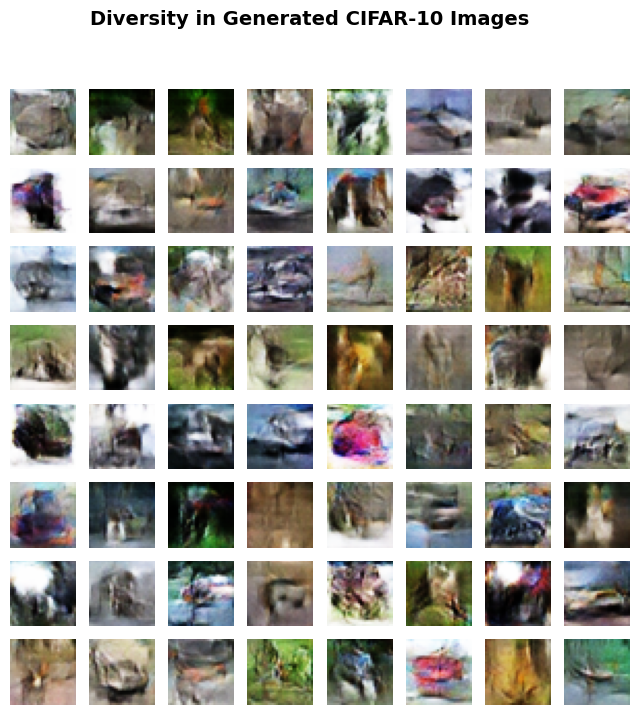

In [15]:
import matplotlib.pyplot as plt
import tensorflow as tf
import numpy as np

# Load trained generator model
generator = tf.keras.models.load_model("cifar10_generator_2.h5")

# Generate a large batch of images
num_samples = 64  # Generate 64 images to analyze diversity
noise = tf.random.normal([num_samples, 100])
generated_images = generator(noise, training=False).numpy()

# Plot generated images in a grid
fig, axes = plt.subplots(8, 8, figsize=(8, 8))

for i, ax in enumerate(axes.flat):
    ax.imshow((generated_images[i] + 1) / 2)  # Normalize to [0,1] for display
    ax.axis("off")

plt.suptitle("Diversity in Generated CIFAR-10 Images", fontsize=14, fontweight="bold")
plt.show()
